# Phân tích dữ liệu kinh doanh - Sales Analysis

**Question 1**: Tháng nào kinh doanh tốt nhất? Doanh thu tháng đó là bao nhiêu?

**Question 2**: Thành phố nào bán được nhiều sản phẩm (product) nhất?

**Question 3**: Khoảng thời gian nào ta nên hiển thị quảng cáo để tăng khả năng mua hàng của khách?

**Question 4**: Sản phẩm được bán nhiều nhất là gì? Tại sao?

#### Xin quyền truy cập Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/ggdrive')

Mounted at /content/ggdrive


#### Khai báo thư viện sử dụng

In [2]:
import os
import pandas as pd

#### Tổng hợp dữ liệu kinh doanh các tháng vào 1 file duy nhất

In [3]:
path = "/content/ggdrive/MyDrive/Data Analyst/Python/Project/Sales_Data"
files = [file for file in os.listdir(path) if not file.startswith('.')] # Ignore hidden files

all_months_data = pd.DataFrame()

for file in files:
    current_data = pd.read_csv(path + "/" + file)
    all_months_data = pd.concat([all_months_data, current_data])

all_months_data.to_csv("/content/ggdrive/MyDrive/Data Analyst/Python/Project/all_data.csv", index=False)

#### Đọc dữ liệu

In [4]:
all_data = pd.read_csv("/content/ggdrive/MyDrive/Data Analyst/Python/Project/all_data.csv")
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,162009,iPhone,1,700,03/28/19 20:59,"942 Church St, Austin, TX 73301"
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301"
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301"
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016"
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016"
...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016"
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215"
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101"
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016"


### Làm sạch dữ liệu
Bước đầu tiên trước bất cứ phân tích nào, bạn cần làm sạch dữ liệu. Để làm sạch dữ liệu, bạn cần xem tổng quan về dữ liệu để đưa ra quyết định. Có thể bạn chưa phát hiện hết các lỗi. Cứ thực hiện các bước xử lý, nếu gặp lỗi, bạn quay trở lại bước xử lý làm sạch dữ liệu để loại bỏ lỗi đó

##### Đếm số dữ liệu trống

In [5]:
all_data.isnull().sum()

Order ID            545
Product             545
Quantity Ordered    545
Price Each          545
Order Date          545
Purchase Address    545
dtype: int64

##### Lấy ra các hàng có ít nhất 1 cột trống (xem lại lab 11)

In [6]:
all_data[all_data.isna().any(axis=1)]

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
1047,NaN,NaN,NaN,NaN,NaN,NaN
1542,NaN,NaN,NaN,NaN,NaN,NaN
1653,NaN,NaN,NaN,NaN,NaN,NaN
2014,NaN,NaN,NaN,NaN,NaN,NaN
2043,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
184588,NaN,NaN,NaN,NaN,NaN,NaN
185335,NaN,NaN,NaN,NaN,NaN,NaN
185553,NaN,NaN,NaN,NaN,NaN,NaN
185703,NaN,NaN,NaN,NaN,NaN,NaN


##### Xóa các dòng có giá trị NaN

In [7]:
all_data = all_data.dropna()
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,162009,iPhone,1,700,03/28/19 20:59,"942 Church St, Austin, TX 73301"
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301"
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301"
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016"
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016"
...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016"
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215"
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101"
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016"


##### Một số dòng không có dữ liệu bán hàng, mà lặp lại nội dung như header. Cần tìm ra các dòng này

In [8]:
error_data = all_data[all_data['Order Date'].str.startswith('Or')]
error_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
433,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
864,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
930,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
1979,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
2032,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address


##### Và loại bỏ các dòng đó

In [9]:
all_data = all_data[~all_data['Order Date'].str.startswith('Or')].copy()
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,162009,iPhone,1,700,03/28/19 20:59,"942 Church St, Austin, TX 73301"
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301"
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301"
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016"
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016"
...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016"
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215"
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101"
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016"


#### Định kiểu dữ liệu chuẩn cho các cột

In [10]:
all_data['Quantity Ordered'] = pd.to_numeric(all_data['Quantity Ordered'])
all_data['Price Each'] = pd.to_numeric(all_data['Price Each'])
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,162009,iPhone,1,700.00,03/28/19 20:59,"942 Church St, Austin, TX 73301"
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301"
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301"
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016"
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016"
...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016"
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215"
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101"
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016"


### Thêm các cột mới, làm rõ dữ liệu, giúp dễ dàng xử lý sau đó

#### Thêm cột Month - tháng

In [11]:
import numpy as np
from datetime import datetime

# Cách 1: Nhanh hơn với Numpy
def func(date):
  date=datetime.strptime(date, '%m/%d/%y %H:%M')
  return date.month

month_handler = np.frompyfunc(func, 1, 1)

all_data['Month'] = month_handler(all_data['Order Date'])
all_data

# Cách 2
# all_data['Month'] = pd.to_datetime(all_data['Order Date']).dt.month
# all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month
0,162009,iPhone,1,700.00,03/28/19 20:59,"942 Church St, Austin, TX 73301",3
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301",3
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301",3
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016",3
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016",3
...,...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016",8
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215",8
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101",8
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016",8


#### Thêm cột City - Thành phố

In [12]:
def func(address):
  city = address.split(",")[1].strip(" ")
  state = address.split(",")[2].split(" ")[1]
  return f"{city} ({state})"

city_handler = np.frompyfunc(func, 1, 1)

all_data['City'] = city_handler(all_data['Purchase Address'])
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,City
0,162009,iPhone,1,700.00,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX)
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX)
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX)
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016",3,San Francisco (CA)
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016",3,San Francisco (CA)
...,...,...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016",8,San Francisco (CA)
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215",8,Boston (MA)
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101",8,Seattle (WA)
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016",8,San Francisco (CA)


## Khai phá dữ liệu!

#### **Question 1**: Tháng nào kinh doanh tốt nhất? Doanh thu tháng đó là bao nhiêu?

Thêm cột Sales

In [13]:
all_data['Sales'] = all_data['Quantity Ordered'].astype('int') * all_data['Price Each'].astype('float')
all_data

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,City,Sales
0,162009,iPhone,1,700.00,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),700.00
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),14.95
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),23.98
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016",3,San Francisco (CA),99.99
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016",3,San Francisco (CA),379.99
...,...,...,...,...,...,...,...,...,...
186845,248146,Bose SoundSport Headphones,1,99.99,08/29/19 22:19,"868 Hickory St, San Francisco, CA 94016",8,San Francisco (CA),99.99
186846,248147,AAA Batteries (4-pack),3,2.99,08/31/19 16:26,"206 Lakeview St, Boston, MA 02215",8,Boston (MA),8.97
186847,248148,AA Batteries (4-pack),1,3.84,08/02/19 07:25,"568 13th St, Seattle, WA 98101",8,Seattle (WA),3.84
186848,248149,USB-C Charging Cable,1,11.95,08/08/19 12:10,"495 Walnut St, San Francisco, CA 94016",8,San Francisco (CA),11.95


Tính tổng Sales các tháng

In [14]:
monthly_sales_df = all_data.groupby(['Month']).sum()
monthly_sales_df

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,City,Sales
Month,,,,,,,,
1,1412341412351412361412371412381412391412401412...,iPhoneLightning Charging CableWired Headphones...,10903,1811768.38,01/22/19 21:2501/28/19 14:1501/17/19 13:3301/0...,"944 Walnut St, Boston, MA 02215185 Maple St, P...",Boston (MA)Portland (OR)San Francisco (CA)Los ...,1822256.73
2,1505021505031505041505051505061505071505081505...,iPhoneAA Batteries (4-pack)27in 4K Gaming Moni...,13449,2188884.72,02/18/19 01:3502/13/19 07:2402/18/19 09:4602/0...,"866 Spruce St, Portland, ME 0410118 13th St, S...",Portland (ME)San Francisco (CA)New York City (...,2202022.42
3,1620091620091620091620101620111620121620131620...,iPhoneLightning Charging CableWired Headphones...,17005,2791207.83,03/28/19 20:5903/28/19 20:5903/28/19 20:5903/1...,"942 Church St, Austin, TX 73301942 Church St, ...",Austin (TX)Austin (TX)Austin (TX)San Francisco...,2807100.38
4,1623581625411650071656221662501663091665671672...,Flatscreen TVAAA Batteries (4-pack)34in Ultraw...,20558,3367671.02,04/01/19 01:1104/01/19 01:1504/01/19 00:1204/0...,"444 12th St, New York City, NY 10001672 2nd St...",New York City (NY)Atlanta (GA)New York City (N...,3390670.24
5,1940951940961940971940981940991941001941011941...,Wired HeadphonesAA Batteries (4-pack)27in FHD ...,18667,3135125.13,05/16/19 17:1405/19/19 14:4305/24/19 11:3605/0...,"669 2nd St, New York City, NY 10001844 Walnut ...",New York City (NY)Dallas (TX)New York City (NY...,3152606.75
6,1957481958691960721961321966381966391976981990...,27in FHD MonitorAAA Batteries (4-pack)Lightnin...,15253,2562025.61,06/01/19 03:2606/01/19 01:0606/01/19 00:1806/0...,"856 Elm St, San Francisco, CA 94016877 Center ...",San Francisco (CA)Dallas (TX)San Francisco (CA...,2577802.26
7,2229102229112229122229132229142229152229162229...,Apple Airpods HeadphonesFlatscreen TVAA Batter...,16072,2632539.56,07/26/19 16:5107/05/19 08:5507/29/19 12:4107/2...,"389 South St, Atlanta, GA 30301590 4th St, Sea...",Atlanta (GA)Seattle (WA)Atlanta (GA)Atlanta (G...,2647775.76
8,2237102255412256582271152275212275212277322296...,Bose SoundSport Headphones27in 4K Gaming Monit...,13448,2230345.42,08/01/19 01:5608/01/19 01:1508/01/19 01:1408/0...,"882 Lake St, San Francisco, CA 94016480 Spruce...",San Francisco (CA)Los Angeles (CA)Los Angeles ...,2244467.88
9,2481512481522481532481542481552481562481572481...,AA Batteries (4-pack)USB-C Charging CableUSB-C...,13109,2084992.09,09/17/19 14:4409/29/19 10:1909/16/19 17:4809/2...,"380 North St, Los Angeles, CA 90001511 8th St,...",Los Angeles (CA)Austin (TX)Los Angeles (CA)Sea...,2097560.13


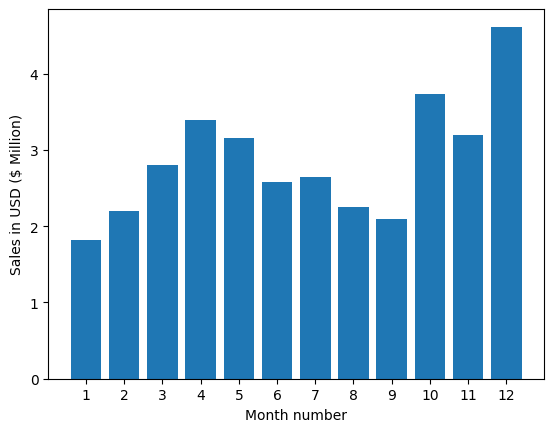

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

months = range(1,13)

plt.bar(months, monthly_sales_df['Sales']/1000000)
plt.xticks(months)
plt.ylabel('Sales in USD ($ Million)')
plt.xlabel('Month number')
plt.show()

#### **Question 2**: Thành phố nào bán được nhiều sản phẩm (product) nhất?

In [16]:
city_sales_df = all_data.groupby(['City']).sum()
city_sales_df

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales
City,,,,,,,,
Atlanta (GA),1620161620191620241620291620381620431620711620...,AAA Batteries (4-pack)AAA Batteries (4-pack)27...,16602,2779908.20,03/19/19 21:1003/05/19 12:2003/17/19 09:2203/2...,"469 Highland St, Atlanta, GA 30301639 4th St, ...",104794,2795498.58
Austin (TX),1620091620091620091620131620261620401620411620...,iPhoneLightning Charging CableWired Headphones...,11153,1809873.61,03/28/19 20:5903/28/19 20:5903/28/19 20:5903/1...,"942 Church St, Austin, TX 73301942 Church St, ...",69829,1819581.75
Boston (MA),1620151620251620311620501620511620691620801620...,AA Batteries (4-pack)AAA Batteries (4-pack)Lig...,22528,3637409.77,03/02/19 08:5203/07/19 20:5003/28/19 17:0303/2...,"949 Jefferson St, Boston, MA 02215110 7th St, ...",141112,3661642.01
Dallas (TX),1620201620331620441620761621161621201621301621...,LG Washing MachineiPhone27in FHD MonitorWired ...,16730,2752627.82,03/26/19 18:1703/19/19 11:0603/22/19 10:1103/0...,"616 Jackson St, Dallas, TX 75001267 Johnson St...",104620,2767975.40
Los Angeles (CA),1620211620271620321620351620371620371620521620...,Wired HeadphonesAAA Batteries (4-pack)Lightnin...,33289,5421435.23,03/30/19 12:0203/16/19 20:5203/31/19 10:3903/0...,"645 Wilson St, Los Angeles, CA 90001421 Main S...",208325,5452570.80
New York City (NY),1620221620451620481620581620611620661620661620...,AA Batteries (4-pack)Apple Airpods HeadphonesA...,27932,4635370.83,03/17/19 22:1803/26/19 13:3103/31/19 19:2403/3...,"473 Hill St, New York City, NY 10001906 Park S...",175741,4664317.43
Portland (ME),1624521624581624841625911627231628131628921629...,27in FHD MonitorApple Airpods HeadphonesBose S...,2750,447189.25,03/02/19 07:2803/11/19 16:1503/05/19 08:1203/3...,"632 7th St, Portland, ME 04101149 Spruce St, P...",17144,449758.27
Portland (OR),1620181620621621031621211621561621961622421622...,USB-C Charging CableAAA Batteries (4-pack)AAA ...,11303,1860558.22,03/18/19 11:0703/24/19 03:3703/18/19 20:5003/2...,"925 Maple St, Portland, OR 97035235 Park St, P...",70621,1870732.34
San Francisco (CA),1620101620111620121620141620171620231620281620...,Bose SoundSport Headphones34in Ultrawide Monit...,50239,8211461.74,03/17/19 05:3903/10/19 00:0103/20/19 21:3303/0...,"261 10th St, San Francisco, CA 94016764 13th S...",315520,8262203.91


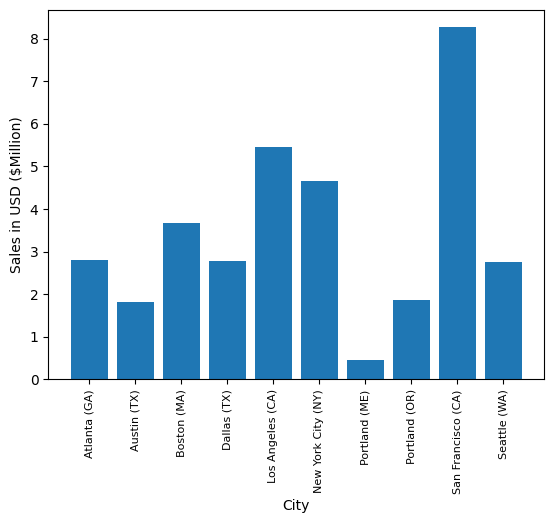

In [17]:
import matplotlib.pyplot as plt

keys = city_sales_df.index

plt.bar(keys, city_sales_df['Sales']/1000000)
plt.ylabel('Sales in USD ($Million)')
plt.xlabel('City')
plt.xticks(keys, rotation='vertical', size=8)
plt.show()

#### **Question 3**: Khoảng thời gian nào ta nên hiển thị quảng cáo để tăng khả năng mua hàng của khách?

Thêm cột Hour

In [18]:
all_data['Hour'] = pd.to_datetime(all_data['Order Date']).dt.hour
all_data['Minute'] = pd.to_datetime(all_data['Order Date']).dt.minute
all_data['Count'] = 1
all_data.head()

<ipython-input-18-60185ffacbe6>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  all_data['Hour'] = pd.to_datetime(all_data['Order Date']).dt.hour
<ipython-input-18-60185ffacbe6>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  all_data['Minute'] = pd.to_datetime(all_data['Order Date']).dt.minute


,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,City,Sales,Hour,Minute,Count
0,162009,iPhone,1,700.00,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),700.00,20,59,1
1,162009,Lightning Charging Cable,1,14.95,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),14.95,20,59,1
2,162009,Wired Headphones,2,11.99,03/28/19 20:59,"942 Church St, Austin, TX 73301",3,Austin (TX),23.98,20,59,1
3,162010,Bose SoundSport Headphones,1,99.99,03/17/19 05:39,"261 10th St, San Francisco, CA 94016",3,San Francisco (CA),99.99,5,39,1
4,162011,34in Ultrawide Monitor,1,379.99,03/10/19 00:01,"764 13th St, San Francisco, CA 94016",3,San Francisco (CA),379.99,0,1,1


In [19]:
hourly_sale_df = all_data.groupby(['Hour']).count()
hourly_sale_df

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,City,Sales,Minute,Count
Hour,,,,,,,,,,,
0,3910,3910,3910,3910,3910,3910,3910,3910,3910,3910,3910
1,2350,2350,2350,2350,2350,2350,2350,2350,2350,2350,2350
2,1243,1243,1243,1243,1243,1243,1243,1243,1243,1243,1243
3,831,831,831,831,831,831,831,831,831,831,831
4,854,854,854,854,854,854,854,854,854,854,854
5,1321,1321,1321,1321,1321,1321,1321,1321,1321,1321,1321
6,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482
7,4011,4011,4011,4011,4011,4011,4011,4011,4011,4011,4011
8,6256,6256,6256,6256,6256,6256,6256,6256,6256,6256,6256


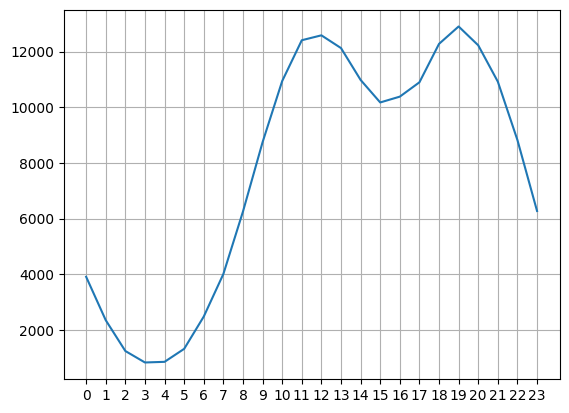

In [20]:
keys = hourly_sale_df.index

plt.plot(keys, hourly_sale_df['Count'])
plt.xticks(keys)
plt.grid()
plt.show()

Với đồ thị trên, ta nên quảng cáo vào khoảng 11h hoặc 7h, khi số lượng sản phẩm được mua đạt đỉnh

#### **Question 4**: Sản phẩm được bán nhiều nhất là gì?

In [21]:
product_df = all_data.groupby('Product').sum()
product_df

,Order ID,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,City,Sales,Hour,Minute,Count
Product,,,,,,,,,,,
20in Monitor,1621101621381622001622561622881622931622971623...,4129,451068.99,03/15/19 09:0503/19/19 10:1003/15/19 14:5003/1...,"705 South St, Los Angeles, CA 90001628 Forest ...",29336,Los Angeles (CA)Seattle (WA)San Francisco (CA)...,454148.71,58764,122252,4101
27in 4K Gaming Monitor,1620241621251621691621741621891622321622591622...,6244,2429637.70,03/17/19 09:2203/29/19 12:1603/11/19 13:4303/0...,"952 Willow St, Atlanta, GA 30301987 Chestnut S...",44440,Atlanta (GA)San Francisco (CA)Dallas (TX)Seatt...,2435097.56,90916,184331,6230
27in FHD Monitor,1620441620581620701621191621531621941622021622...,7550,1125974.93,03/22/19 10:1103/30/19 02:3003/15/19 18:1903/0...,"469 9th St, Dallas, TX 75001510 Church St, New...",52558,Dallas (TX)New York City (NY)Los Angeles (CA)A...,1132424.50,107540,219948,7507
34in Ultrawide Monitor,1620111620131621121621391621681622071623471624...,6199,2348718.19,03/10/19 00:0103/15/19 23:0503/15/19 21:5203/2...,"764 13th St, San Francisco, CA 94016904 Main S...",43304,San Francisco (CA)Austin (TX)Boston (MA)New Yo...,2355558.01,89076,183480,6181
AA Batteries (4-pack),1620121620151620221620391620431620481620551620...,27635,79015.68,03/20/19 21:3303/02/19 08:5203/17/19 22:1803/2...,"187 Ridge St, San Francisco, CA 94016949 Jeffe...",145558,San Francisco (CA)Boston (MA)New York City (NY...,106118.40,298342,609039,20577
AAA Batteries (4-pack),1620161620191620251620271620281620291620381620...,31017,61716.59,03/19/19 21:1003/05/19 12:2003/07/19 20:5003/1...,"469 Highland St, Atlanta, GA 30301639 4th St, ...",146370,Atlanta (GA)Atlanta (GA)Boston (MA)Los Angeles...,92740.83,297332,612113,20641
Apple Airpods Headphones,1620231620411620451620741620751620801621261621...,15661,2332350.00,03/11/19 20:0003/14/19 01:0103/26/19 13:3103/0...,"404 Park St, San Francisco, CA 94016633 13th S...",109477,San Francisco (CA)Austin (TX)New York City (NY...,2349150.00,223304,455570,15549
Bose SoundSport Headphones,1620101620471620731620901620911620961621131621...,13457,1332366.75,03/17/19 05:3903/08/19 18:4103/23/19 20:5203/1...,"261 10th St, San Francisco, CA 94016819 9th St...",94113,San Francisco (CA)Austin (TX)San Francisco (CA...,1345565.43,192445,392603,13325
Flatscreen TV,1620921620971620981621151621571621631621801622...,4819,1440000.00,03/18/19 11:2903/28/19 13:4303/07/19 15:4403/2...,"477 11th St, Seattle, WA 98101929 Elm St, New ...",34224,Seattle (WA)New York City (NY)New York City (N...,1445700.00,68815,142789,4800


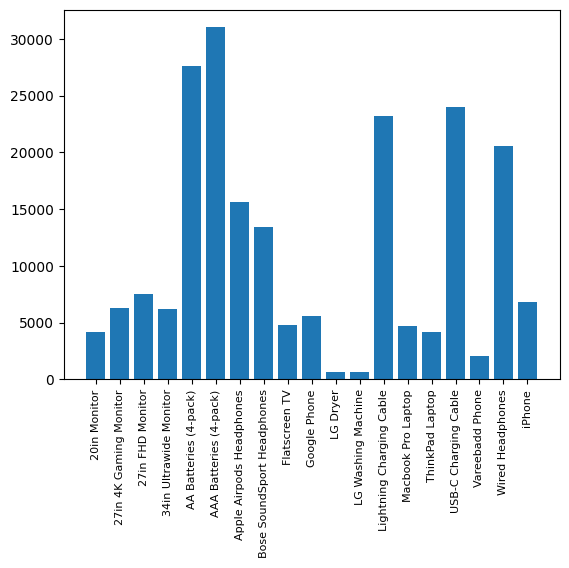

In [22]:
keys = product_df.index

plt.bar(keys, product_df['Quantity Ordered'])
plt.xticks(keys, rotation='vertical', size=8)
plt.show()

<ipython-input-23-d4839bd18c25>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(keys, rotation='vertical', size=8)


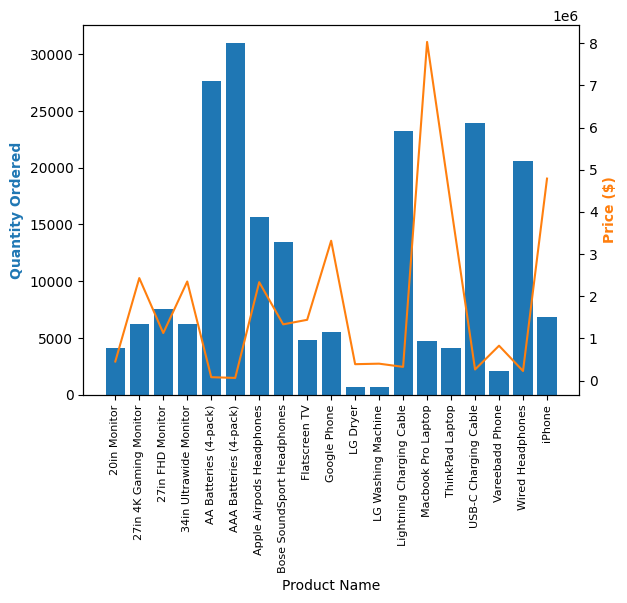

In [23]:
prices = all_data.groupby('Product').sum()['Price Each']

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.bar(keys, product_df['Quantity Ordered'], color='#1f77b4')
ax2.plot(keys, prices, color='#ff7f0e')

ax1.set_xlabel('Product Name')
ax1.set_ylabel('Quantity Ordered', color='#1f77b4', weight='bold')
ax2.set_ylabel('Price ($)', color='#ff7f0e', weight='bold')
ax1.set_xticklabels(keys, rotation='vertical', size=8)

fig.show()